# Yelp Data Challenge - Clustering and PCA

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
% matplotlib inline
plt.style.use("ggplot")

In [2]:
df = pd.read_csv('data/last_2_years_restaurant_reviews.csv')

In [3]:
df.head(2)

,business_id,name,categories,bus_stars,funny,user_id,review_id,text,stars,date,useful,type,cool
0,--9e1ONYQuAa-CB_Rrw7Tw,Delmonico Steakhouse,"[Steakhouses, Restaurants, Cajun/Creole]",4.0,0,0XVzm4kVIAaH4eQAxWbhvw,nCqdz-NW64KazpxqnDr0sQ,I mainly went for the ceasar salad prepared ta...,1,2015-06-26,0,review,0
1,--9e1ONYQuAa-CB_Rrw7Tw,Delmonico Steakhouse,"[Steakhouses, Restaurants, Cajun/Creole]",4.0,0,2aeNFntqY2QDZLADNo8iQQ,iwx6s6yQxc7yjS7NFANZig,Nice atmosphere and wonderful service. I had t...,4,2015-06-29,0,review,0


## 1. Cluster the review text data for all the restaurants

### Define your feature variables, here is the text of the review

In [4]:
# Take the values of the column that contains review text data, save to a variable named "documents"
documents = df.text.values

### Define your target variable (any categorical variable that may be meaningful)

#### For example, I am interested in perfect (5 stars) and imperfect (1-4 stars) rating

In [5]:
# Make a column and take the values, save to a variable named "target"
target = (df.stars > 4).astype(int).values

#### You may want to look at the statistic of the target variable

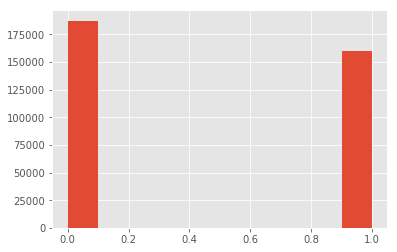

In [6]:
# To be implemented
fig, axes = plt.subplots(1,1)
hist = axes.hist(target, align = 'mid', range = (0, 1))

### Create training dataset and test dataset

In [7]:
from sklearn.model_selection import train_test_split

In [9]:
# documents is your X, target is your y
# Now split the data to training set and test set
# You may want to start with a big "test_size", since large training set can easily crash your laptop.
train_x, test_x, train_y, test_y = train_test_split(documents, target, test_size = 0.7, random_state = 1)

### Get NLP representation of the documents

#### Fit TfidfVectorizer with training data only, then tranform all the data to tf-idf

In [10]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [11]:
# Create TfidfVectorizer, and name it vectorizer, choose a reasonable max_features, e.g. 1000
vectorizer = TfidfVectorizer(stop_words = 'english', token_pattern = r'[a-z,A-Z]+[a-z,A-Z]+', max_features = 1000)

In [12]:
# Train the model with your training data
vectorizer = vectorizer.fit(train_x)

In [13]:
# Get the vocab of your tfidf
vocabulary = vectorizer.get_feature_names()

In [14]:
# Use the trained model to transform all the reviews
train_matrix = vectorizer.transform(train_x).toarray()
test_matrix = vectorizer.transform(test_x).toarray()

### Cluster reviews with KMeans

#### Fit k-means clustering with the training vectors and apply it on all the data

In [15]:
# To be implemented
from sklearn.cluster import KMeans
km = KMeans(n_clusters = 2, random_state = 2)

In [16]:
# transform train_matrix to matrix of distance to each center
train_dis_matrix = km.fit_transform(train_matrix)

In [17]:
print "sum of distance of observations to their closet centers"
print km.inertia_

sum of distance of observations to their closet centers
99096.5144437


In [18]:
train_dis_matrix

array([[ 0.99121188,  0.95179488],
       [ 0.96091796,  0.98311096],
       [ 0.98519591,  0.9805234 ],
       ..., 
       [ 0.9880728 ,  0.98819209],
       [ 0.98554107,  0.98400858],
       [ 0.96870946,  0.95231228]])

In [19]:
print "let's look at labels:"
print km.labels_

let's look at labels:
[1 0 1 ..., 0 1 1]


In [20]:
manual_distance = 0
for i in range(len(km.labels_)):
    manual_distance += train_dis_matrix[i][km.labels_[i]]
print "manually computed distance is"
print manual_distance

manually computed distance is
101621.761311


In [21]:
print km.cluster_centers_

[[ 0.00442077  0.00527755  0.00141405 ...,  0.00188686  0.00330693
   0.00585402]
 [ 0.00237856  0.01031049  0.00317341 ...,  0.0010546   0.00307457
   0.00670811]]


In [22]:
# from sklearn.metrics.pairwise import euclidean_distances
from scipy.spatial.distance import euclidean
manual_distance2 = 0
for i in range(len(km.labels_)):
    manual_distance2 += euclidean(train_matrix[i],km.cluster_centers_[km.labels_[i]]) ** 2
print manual_distance2

99096.5144437


### it turns out that the km.inertia_ is the sqaure euclidean distance

#### Make predictions on all your data

In [23]:
# To be implemented
test_pre_labels = km.predict(test_matrix)

#### Inspect the centroids
To find out what "topics" Kmeans has discovered we must inspect the centroids. Print out the centroids of the Kmeans clustering.

   These centroids are simply a bunch of vectors.  To make any sense of them we need to map these vectors back into our 'word space'.  Think of each feature/dimension of the centroid vector as representing the "average" review or the average occurances of words for that cluster.

#### Find the top 10 features for each cluster.
For topics we are only really interested in the most present words, i.e. features/dimensions with the greatest representation in the centroid.  Print out the top ten words for each centroid.

* Sort each centroid vector to find the top 10 features
* Go back to your vectorizer object to find out what words each of these features corresponds to.


In [24]:
# To be implemented
top_n = 10
top_center = km.cluster_centers_.argsort()[:,-1:-top_n:-1]

In [25]:
top_center

array([[351, 311, 637, 442, 470, 887, 592, 764, 685],
       [359, 311, 637, 764,  12,  64, 494, 351, 933]], dtype=int64)

In [26]:
for center, index in enumerate(top_center):
    print "for class %d: top %d frequent words are" %(center, top_n)
    print [vocabulary[i] for i in index]

for class 0: top 10 frequent words are
[u'good', u'food', u'place', u'just', u'like', u'time', u'ordered', u'service', u'really']
for class 1: top 10 frequent words are
[u'great', u'food', u'place', u'service', u'amazing', u'best', u'love', u'good', u'vegas']


#### Try different k
If you set k == to a different number, how does the top features change?

In [27]:
# To be implemented
# from math import sqrt
mix_k = len(df.stars.unique()) - 1
min_k = 2

In [28]:
train_dis_list = []
test_dis_list = []
for k in range(min_k, mix_k + 1):
    km = KMeans(n_clusters = k, random_state = 2)
    km.fit(train_matrix)
    train_dis_list.append(km.inertia_)
    
    test_labels = km.predict(test_matrix)
    test_dis = 0
    for i, label in enumerate(test_labels):
        test_dis += euclidean(test_matrix[i], km.cluster_centers_[label]) ** 2
    test_dis_list.append(test_dis)

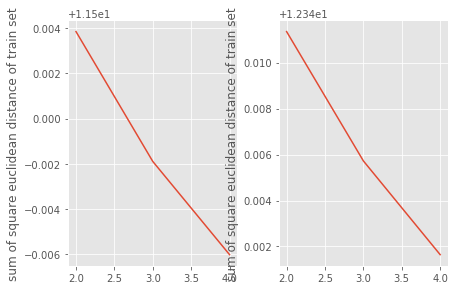

In [29]:
# for train, test set, ploting elbow k
from math import log
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.tight_layout()
ax1.plot(range(min_k,mix_k + 1), np.log(train_dis_list))
train_y_label = ax1.set_ylabel("sum of square euclidean distance of train set")

ax2.plot(range(min_k,mix_k + 1), np.log(test_dis_list))
test_y_label = ax2.set_ylabel("sum of square euclidean distance of train set")

# from graph above, K = 3 may be the optimal number of clusters

#### Print out the rating and review of a random sample of the reviews assigned to each cluster to get a sense of the cluster.

In [30]:
# To be implemented
opt_k = 3
opt_km = KMeans(n_clusters = opt_k, random_state = 3)
opt_km.fit(train_matrix)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=3, tol=0.0001, verbose=0)

In [31]:
for i in range(opt_k):
    sample_cond = (opt_km.labels_ == i)
    sample_doc = train_x[sample_cond]
    sample_tar = train_y[sample_cond]
    sample_index = np.random.choice(len(sample_doc))
    print sample_doc[sample_index]
    print sample_tar[sample_index]
    print "---------------------------------------------------"

I'm not sure how Dominos or Little Caesar's crappy pizza hasn't put this dump out of business.
I had a customer take me here, so we showed up and there's a buzzer that you have to press to get in at night (a sure sign it's a high-class place) and you walk in to the scent of stale cigarette smoke. The waitstaff spent more time talking to each other & moving at the speed-of-I-don't-give-a-damn than getting customers orders. Finally it took us 45 minutes to get the semi-descent Pizza but not any better than Dominos or whatever other crappy pizza chain place.
About the only bright spot is the bar where the bar tender was attentive and bothered to pay attention to what's going on. There has to be better places here in Vegas to eat.
0
---------------------------------------------------
Rocky and Steve at bar had great service, very friendly. The food was great ordered the prime rib and was cooked perfectly to order. Will be back this is a first class restaurant with great service and food!! 

## 2. Cluster all the reviews of the most reviewed restaurant
Let's find the most reviewed restaurant and analyze its reviews

In [32]:
# Find the business who got most reviews, get your filtered df, name it df_top_restaurant
# top_restaurant = df.groupby("business_id").size().sort_values(ascending = False).index[0]
# more easy way
top_restaurant = df.business_id.value_counts().index[0]

In [33]:
top_restaurant

'hihud--QRriCYZw1zZvW4g'

In [34]:
df_top_restaurant = df[df.business_id == top_restaurant]

In [35]:
df_top_restaurant.reset_index(drop = True, inplace = True)

In [36]:
df_top_restaurant.head(2)

,business_id,name,categories,bus_stars,funny,user_id,review_id,text,stars,date,useful,type,cool
0,hihud--QRriCYZw1zZvW4g,Gangnam Asian BBQ Dining,"[Korean, Japanese, Restaurants, Tapas/Small Pl...",4.5,0,mtGw8bQTQToVR_1KWD7F7A,xgeXscn1gdG5I9w-p2tqig,Excellent food with great service that's near ...,5,2016-10-01,1,review,0
1,hihud--QRriCYZw1zZvW4g,Gangnam Asian BBQ Dining,"[Korean, Japanese, Restaurants, Tapas/Small Pl...",4.5,0,RVGxGRTnVOeCLMPT4JAYuw,jHeg2v19v4RsN2UnDlCsFQ,We were in town for the weekend and really enj...,5,2016-08-20,0,review,0


In [37]:
# df_top_restaurant.to_csv('data/top_restaurant.csv', encoding = 'utf-8', index = False)

In [38]:
# df_top_restaurant = pd.read_csv('data/top_restaurant.csv')

In [39]:
# df_top_restaurant.head(2)

We can also load restaurant profile information from the business dataset (optional)

In [40]:
# Load business dataset (optional)
# Take a look at the most reviewed restaurant's profile (optional)
pass

### Vectorize the text feature

In [41]:
# Take the values of the column that contains review text data, save to a variable named "documents_top_restaurant"
documents_top_restaurant = df_top_restaurant.text.values

### Define your target variable (for later classification use)

#### Again, we look at perfect (5 stars) and imperfect (1-4 stars) rating

In [42]:
# To be implemented
star_top_restaurant = (df_top_restaurant.stars.values > 4).astype(int)

#### Check the statistic of the target variable

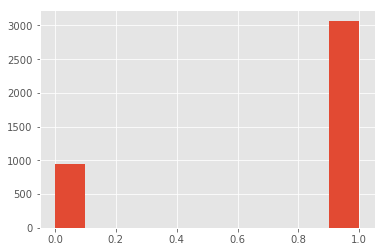

In [43]:
# To be implemented
fig, axes = plt.subplots(1,1)
hist = axes.hist(star_top_restaurant, align = 'mid', range = (0, 1))

### Create training dataset and test dataset

In [44]:
# documents_top_restaurant is your X, target_top_restaurant is your y
# Now split the data to training set and test set
# Now your data is smaller, you can use a typical "test_size", e.g. 0.3-0.7
from sklearn.model_selection import train_test_split
train_tr_x, test_tr_x, train_tr_y, test_tr_y = train_test_split(documents_top_restaurant, star_top_restaurant, 
                                                                test_size = 0.3, random_state = 1)

### Get NLP representation of the documents

In [45]:
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
from sklearn.cluster import KMeans
from scipy.spatial.distance import euclidean

In [46]:
# Create TfidfVectorizer, and name it vectorizer
vectorizer_tr = TfidfVectorizer(max_features = 1000, stop_words = stopwords.words('english'), token_pattern = u'[a-z,A-Z]+[a-z,A-Z]+')

In [47]:
# Train the model with your training data
vectorizer_tr = vectorizer_tr.fit(train_tr_x)

In [48]:
# Get the vocab of your tfidf
vocabulary_tr = vectorizer_tr.get_feature_names()

In [49]:
# Use the trained model to transform the test data
test_tr_tfidf = vectorizer_tr.transform(test_tr_x).toarray()

In [50]:
# Use the trained model to transform all the data
train_tr_tfidf = vectorizer_tr.transform(train_tr_x).toarray()

### Cluster reviews with KMeans

#### Fit k-means clustering on the training vectors and make predictions on all data

In [51]:
# To be implemented
min_tr_k = 1
max_tr_k = 5
km_tr_list = list()
train_tr_dis_list = []
test_tr_dis_list = []

for k in range(min_tr_k, max_tr_k + 1):
    km = KMeans(n_clusters = k, random_state = 3)
    km.fit(train_tr_tfidf)
    km_tr_list.append(km)
    
    train_tr_dis_list.append(km.inertia_)
    
    test_labels = km.predict(test_tr_tfidf)
    test_dis = 0
    for i, label in enumerate(test_labels):
        test_dis += euclidean(test_tr_tfidf[i], km.cluster_centers_[label]) ** 2
    test_tr_dis_list.append(test_dis)

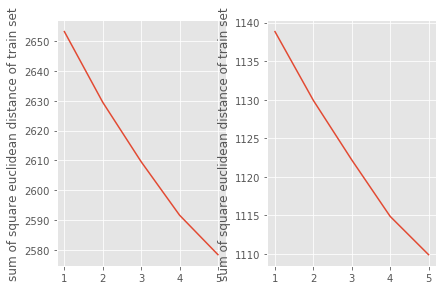

In [52]:
fig, (ax1, ax2)= plt.subplots(1,2)

fig.tight_layout()
ax1.plot(range(min_tr_k,max_tr_k + 1), train_tr_dis_list)
train_y_label = ax1.set_ylabel("sum of square euclidean distance of train set")

ax2.plot(range(min_tr_k,max_tr_k + 1), test_tr_dis_list)
test_y_label = ax2.set_ylabel("sum of square euclidean distance of train set")

# it looks like when k = 4, there is an elbow, but we would like to use silhouette_score to verify that.

In [53]:
from sklearn.metrics import silhouette_score
train_sil_list = []
test_sil_list = []
for km in km_tr_list[1:]:
    # print(len(km.labels_))
    train_sil_list.append(silhouette_score(train_tr_tfidf, km.labels_))
    test_sil_list.append(silhouette_score(test_tr_tfidf, km.predict(test_tr_tfidf)))

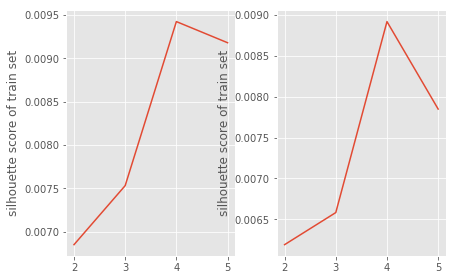

In [54]:
fig, (ax1, ax2)= plt.subplots(1,2)

fig.tight_layout()
ax1.plot(range(min_tr_k + 1, max_tr_k + 1), train_sil_list)
train_y_label = ax1.set_ylabel("silhouette score of train set")

ax2.plot(range(min_tr_k + 1, max_tr_k + 1), test_sil_list)
test_y_label = ax2.set_ylabel("silhouette score of train set")

# now we can confirm that k = 4 is the optimal numer of classes
# but notice that score values are so close to 0 that I suspect there exits overlap

#### Make predictions on all your data

In [55]:
# To be implemented
opt_tr_km = km_tr_list[3]

In [56]:
# above I've already made predictions on all data

#### Inspect the centroids

In [57]:
# To be implemented
opt_tr_km.cluster_centers_

array([[  3.01638298e-03,   3.25260652e-18,   7.98980989e-03, ...,
          2.75307524e-04,   8.81658951e-04,   4.44764322e-03],
       [  2.64134580e-03,   9.93304407e-04,   3.65985550e-03, ...,
          1.49117217e-03,   3.57933999e-03,   1.00627756e-02],
       [  1.06843466e-03,   8.29550473e-04,   1.67708195e-03, ...,
          1.39666628e-03,   2.70024507e-03,   9.61844741e-03],
       [  4.83825319e-03,   1.30132977e-03,   8.49901676e-04, ...,
          1.95156391e-18,   7.87140381e-03,   6.34965223e-03]])

#### Find the top 10 features for each cluster.

In [58]:
# To be implemented
top_n = 10
for i, cluster in enumerate(opt_tr_km.cluster_centers_):
    index = np.argsort(cluster)[::-1][:top_n]
    print [vocabulary_tr[j] for j in index]

[u'great', u'food', u'service', u'back', u'place', u'come', u'definitely', u'time', u'amazing', u'recommend']
[u'good', u'meat', u'food', u'really', u'service', u'place', u'ordered', u'beef', u'korean', u'delicious']
[u'korean', u'bbq', u'best', u'vegas', u'place', u'las', u'food', u'good', u'service', u'ever']
[u'happy', u'hour', u'great', u'food', u'good', u'pm', u'service', u'place', u'awesome', u'bulgogi']


# it seems that top 10 features for each group don't have much difference

#### Print out the rating and review of a random sample of the reviews assigned to each cluster to get a sense of the cluster.

In [59]:
# To be implemented
for i in range(4):
    sample_cond = (opt_tr_km.labels_ == i)
    sample_doc = train_tr_x[sample_cond]
    sample_tar = train_tr_y[sample_cond]
    sample_index = np.random.choice(len(sample_doc))
    print sample_doc[sample_index]
    print sample_tar[sample_index]
    print "---------------------------------------------------"

This place was so bomb!! High quality meat and service! Great side dishes and reasonable prices! Definitely recommend the Korean prime Kalbi and prime Kalbi! For sure coming back here next time we're in town!
1
---------------------------------------------------
Trying this restaurant for the first time! 7 ban chans offered. Lunch special is reasonable price for the amount you get.
1
---------------------------------------------------
Best restaurant .. I'm a meat lover .. Very reasonable prices .. Very generous with amounts and side dishes ... Courteous staff .. Very clean .. This will be my favorite restaurant in Vegas :)
1
---------------------------------------------------
Best meat NA. Faker ain't got shit on this place. Happy hour deals are really really awesomely good. Will come back again.
1
---------------------------------------------------


## 3. Use PCA to reduce dimensionality

### Stardardize features
Your X_train and X_test

In [60]:
from sklearn.preprocessing import StandardScaler

# To be implemented
standizer = StandardScaler()
train_std_x = standizer.fit_transform(train_matrix)
test_std_x = standizer.fit_transform(test_matrix)

### Use PCA to transform data (train and test) and get princial components

In [61]:
from sklearn.decomposition import PCA

# Let's pick a n_components
n_components = 50
pca = PCA(n_components = n_components)
# To be implemented
trian_pri_x = pca.fit_transform(train_std_x)
test_pri_x = pca.transform(test_std_x)

### See how much (and how much percentage of) variance the principal components explain

In [62]:
# To be implemented
print pca.explained_variance_

[ 5.32483306  4.20783794  3.15294174  2.81615518  2.72249577  2.56972378
  2.41063185  2.36793359  2.27878538  2.22976804  2.19430965  2.15743234
  2.09254629  2.01793232  1.95256205  1.9424054   1.91321549  1.85451096
  1.8220016   1.80925512  1.79842149  1.7349338   1.72797453  1.70361139
  1.64829324  1.64301055  1.59943693  1.5879882   1.57155437  1.55272413
  1.53971891  1.52105053  1.50448743  1.49751989  1.48220327  1.46537503
  1.45327213  1.44252207  1.43010285  1.41951095  1.41024449  1.40581241
  1.38761692  1.37776753  1.369486    1.34620697  1.34236057  1.31756966
  1.30678953  1.29746933]


In [63]:
# To be implemented
print pca.explained_variance_ratio_

[ 0.00532483  0.00420784  0.00315294  0.00281616  0.0027225   0.00256972
  0.00241063  0.00236793  0.00227879  0.00222977  0.00219431  0.00215743
  0.00209255  0.00201793  0.00195256  0.00194241  0.00191322  0.00185451
  0.001822    0.00180926  0.00179842  0.00173493  0.00172797  0.00170361
  0.00164829  0.00164301  0.00159944  0.00158799  0.00157155  0.00155272
  0.00153972  0.00152105  0.00150449  0.00149752  0.0014822   0.00146538
  0.00145327  0.00144252  0.0014301   0.00141951  0.00141024  0.00140581
  0.00138762  0.00137777  0.00136949  0.00134621  0.00134236  0.00131757
  0.00130679  0.00129747]


In [64]:
print pca.explained_variance_ratio_.sum()

0.0947223126349


### Viz: plot proportion of variance explained with top principal components

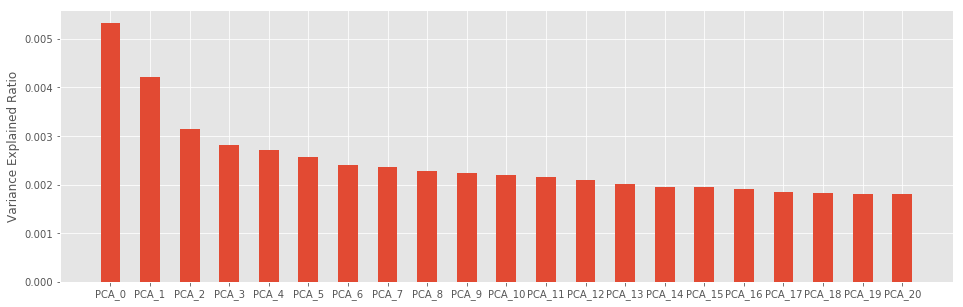

In [70]:
# To be implemented
pca_range = np.arange(21)
pca_names = ['PCA_%s' % i for i in pca_range]

fig, axes = plt.subplots(1,1, figsize = (16,5))

axes.bar(pca_range, pca.explained_variance_ratio_[:21], width = 0.5)

xticks = axes.set_xticks(pca_range)
x_tick_label = axes.set_xticklabels(pca_names)
y_label = axes.set_ylabel("Variance Explained Ratio")

## Classifying positive/negative review with PCA preprocessing

### Logistic Regression Classifier
#### Use standardized tf-idf vectors as features

In [71]:
# Build a Logistic Regression Classifier, train with standardized tf-idf vectors

from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(solver = 'sag')

In [72]:
# To be implemented
lr.fit(X = train_std_x, y = train_y)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='sag', tol=0.0001,
          verbose=0, warm_start=False)

In [73]:
# Get score for training set
train_std_score = lr.score(X = train_std_x, y = train_y)

In [74]:
print train_std_score

0.816023397421


In [75]:
# Get score for test set
test_std_score = lr.score(X = test_std_x, y = test_y)

In [76]:
print test_std_score

0.812701883009


#### Use (Stardardized + PCA) tf-idf vectors as features

In [77]:
# Build a Logistic Regression Classifier, train with PCA tranformed X

# from sklearn.linear_model import LogisticRegression

# # To be implemented
lr_pca = LogisticRegression(solver = 'sag')
lr_pca.fit(trian_pri_x, train_y)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='sag', tol=0.0001,
          verbose=0, warm_start=False)

In [78]:
# Get score for training set
train_pca_score = lr_pca.score(X = trian_pri_x, y = train_y)
print train_pca_score

0.795828738553


In [79]:
# Get score for test set, REMEMBER to use PCA-transformed X!
test_pca_score = lr_pca.score(X = test_pri_x, y = test_y)
print test_pca_score

0.798326579927


# result using pca is a little worse than that without pca due to pca can result in some information lose

#### You can plot the coefficients against principal components


### Random Forest Classifier
#### Use standardized tf-idf vectors as features

In [81]:
# Build a Random Forest Classifier

from sklearn.ensemble import RandomForestClassifier

In [82]:
# To be implemented
# use default parameter setting
rf_std = RandomForestClassifier()
rf_std.fit(train_std_x, train_y)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=10, n_jobs=1, oob_score=False, random_state=None,
            verbose=0, warm_start=False)

In [83]:
# Get score for training set
print rf_std.score(X = train_std_x, y = train_y)

0.989336913267


In [84]:
# Get score for test set
print rf_std.score(X = test_std_x, y = test_y)

0.761702022734


#### Use (Stardardized + PCA) tf-idf vectors as features

In [85]:
# Build a Random Forest Classifier

# from sklearn.ensemble import RandomForestClassifier

# To be implemented
rf_pca = RandomForestClassifier()
rf_pca.fit(trian_pri_x, train_y)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=10, n_jobs=1, oob_score=False, random_state=None,
            verbose=0, warm_start=False)

In [86]:
# Get score for training set
print rf_pca.score(X = trian_pri_x, y = train_y)

0.988560195618


In [87]:
# Get score for test set, REMEMBER to use PCA-transformed X!
print rf_pca.score(X = test_pri_x, y = test_y)

0.749928082389


#### Q: What do you see from the training result and the test result?

# it looks like it outperforms Logistical Regression

#### You can plot the feature importances against principal components


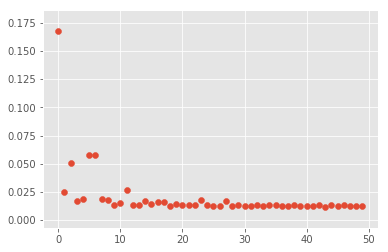

In [88]:
# To be implemented
plt.scatter(x = range(n_components), y = rf_pca.feature_importances_)

## Extra Credit #1: Can you cluster restaurants from their category information?
Hint: a business may have mutiple categories, e.g. a restaurant can have both "Restaurants" and "Korean"

In [89]:
# To be implemented
# we would like to create tfidf using categoiry value

# first step: filter distinct business
dis_df = df.drop_duplicates(subset = 'business_id')

In [90]:
dis_df.reset_index(drop = True, inplace = True)

In [91]:
# second step: 
category = dis_df.categories.values
business = dis_df.business_id.values

In [92]:
from sklearn.model_selection import train_test_split

In [93]:
train, test, train_bus, test_bus = train_test_split(category, business, test_size = 0.6)

In [94]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [95]:
vectorizer = TfidfVectorizer(stop_words = 'english')

In [96]:
vectorizer = vectorizer.fit(train)

In [97]:
# third step: create vocabulary
vocabulary = vectorizer.get_feature_names()
print len(vocabulary)

309


In [98]:
train_matrix = vectorizer.transform(train).toarray()
test_matrix = vectorizer.transform(test).toarray()

In [99]:
# try to find the range of k
from math import sqrt
sqrt(len(category))
# it seems too many, so we would also like to cluster these restaurants in 5 categories

65.97726881282674

In [100]:
from sklearn.cluster import KMeans
km = KMeans(n_clusters = 5)

In [101]:
km.fit(train_matrix)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=5, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [102]:
for i, cluster in enumerate(km.cluster_centers_):
    index = np.argsort(cluster)[::-1][:7]
    print [vocabulary[j] for j in index]

[u'fast', u'food', u'restaurants', u'burgers', u'sandwiches', u'mexican', u'chicken']
[u'pizza', u'italian', u'restaurants', u'food', u'salad', u'wings', u'chicken']
[u'american', u'traditional', u'bars', u'new', u'nightlife', u'restaurants', u'breakfast']
[u'restaurants', u'mexican', u'food', u'bars', u'japanese', u'sandwiches', u'sushi']
[u'chinese', u'restaurants', u'fast', u'food', u'asian', u'fusion', u'japanese']


## Extra Credit #2: Can you try different distance/similarity metrics for clusterings, e.g. Pearson correlation, Jaccard distance, etc. 

Hint: You can take a look at [scipy](http://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.distance.pdist.html#scipy.spatial.distance.pdist) documentations to use other distances

#### Q: How do you compare with Cosine distance or Euclidean distance?

# let's try hierarchy clustering

In [103]:
from scipy.spatial.distance import squareform, pdist

In [104]:
# try jaccard distance
jac_dist = squareform(pdist(train_matrix, metric = 'jaccard'))

In [105]:
jac_dist

array([[ 0.,  1.,  1., ...,  1.,  1.,  1.],
       [ 1.,  0.,  1., ...,  1.,  1.,  1.],
       [ 1.,  1.,  0., ...,  1.,  1.,  1.],
       ..., 
       [ 1.,  1.,  1., ...,  0.,  1.,  1.],
       [ 1.,  1.,  1., ...,  1.,  0.,  1.],
       [ 1.,  1.,  1., ...,  1.,  1.,  0.]])

In [106]:
cos_dist = pdist(train_matrix, metric = 'cosine')

In [107]:
print cos_dist

[ 0.96977188  0.93503528  0.97466524 ...,  0.98668621  0.99042887
  0.97513051]


In [108]:
from scipy.cluster.hierarchy import linkage

In [109]:
link = linkage(cos_dist, method = 'complete')
# alternatively, link = linkage(train_matrix, method, metric = 'cosine')

In [110]:
link

array([[  0.00000000e+00,   2.74000000e+02,   0.00000000e+00,
          2.00000000e+00],
       [  2.00000000e+00,   5.89000000e+02,   0.00000000e+00,
          2.00000000e+00],
       [  2.58000000e+02,   6.37000000e+02,   0.00000000e+00,
          2.00000000e+00],
       ..., 
       [  3.47600000e+03,   3.47700000e+03,   9.98548092e-01,
          1.72800000e+03],
       [  3.41000000e+03,   3.47800000e+03,   9.98777433e-01,
          1.73800000e+03],
       [  3.39100000e+03,   3.47900000e+03,   9.99059842e-01,
          1.74100000e+03]])

In [111]:
from scipy.cluster.hierarchy import dendrogram

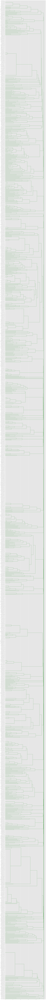

In [112]:
fig, ax = plt.subplots(1, figsize = (24, 600))
label = dis_df.business_id.values
dendro = dendrogram(link, labels = label, color_threshold = 1.5, leaf_font_size = 10, orientation='right')

## Extra Credit #3: Can you cluster categories from business entities? What does it mean by a cluster?
Hint: Think the example where words can be clustered from the transposed tf-idf matrix.

# Intuitively, categories in the same cluster are more likely to have similiar business

In [113]:
train_matrix_t = np.transpose(train_matrix)

In [114]:
train_matrix_t

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       ..., 
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]])

In [115]:
cos_dist_t = pdist(train_matrix_t, metric = 'cosine')

In [116]:
print cos_dist_t

[ 1.  1.  1. ...,  1.  1.  1.]


In [117]:
link_t = linkage(train_matrix_t, method = 'complete', metric = 'cosine')

In [118]:
fig, ax = plt.subplots(1, figsize = (12, 400))
label_t = dis_df.categories.values
dendro = dendrogram(link_t, labels = label_t, color_threshold = 1.5, leaf_font_size = 50, orientation='right')

## Extra Credit #4: What are the characteristics of each of the clustered  ? For each cluster, which restaurant can best represent ("define") its cluster?
Hint: how to interpret "best"?

In [119]:
# In my perspective, we can find most representitive business for each category as follows
# first, can we find top_n, maybe top 10, words for each category
# second, we can sum up tfidf of these 10 words for each business in the same category
# finally, the best business is the one that gets higheset score.

In [120]:
# let's take extra credit 1 for example
top_n = 10
for i, cluster in enumerate(km.cluster_centers_):
    
    # find index of top_n words for each cluster center
    voc_index = np.argsort(cluster)[::-1][:top_n]
    
    # find index of business in the same cluster
    cluster_index = (i == km.labels_)
    
    # find coresponding tfidf matrix and business
    cluster_tfidf = train_matrix[cluster_index]
    cluster_bus = train_bus[cluster_index]
    
    # find the "best" business id for each category and print
    max_j = 0
    max_score = 0
    for j,tfidf in enumerate(cluster_tfidf):
        if max_score < sum([tfidf[k] for k in voc_index]):
            max_j = j
    print cluster_bus[j]

KY5-vGUZhDmDi1ieXRUmmw
g9iIBuh-g4ld3w3kUWLMqw
OcHZMxSYubLUg64aBU27sA
hMh9XOwNQcu31NAOCqhAEw
Z6bIu9gOxDbr8DjrbxIn1g
